In [3]:
#hide
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()
from fastbook import *
from fastai.vision.widgets import *

In [4]:
key = os.environ.get('AZURE_SEARCH_KEY', 'a8bfc3044f804fe59af54edd0e58339d')

In [5]:
search_images_bing

<function fastbook.search_images_bing(key, term, min_sz=128, max_images=150)>

In [6]:
results = search_images_bing(key, 'Boeing 747')
ims = results.attrgot('contentUrl')
len(ims)

150

In [7]:
plane_types = 'Boeing 747','Airbus A380'
path = Path('planes')

In [8]:
if not path.exists():
    path.mkdir()
    for plane in plane_types:
        dest = (path/plane)
        dest.mkdir(exist_ok=True)
        results = search_images_bing(key, plane)
        download_images(dest, urls=results.attrgot('contentUrl'))

In [ ]:
fns = get_image_files(path)
fns

(#275) [Path('planes/Airbus A380/4422b0c2-a26a-4ee3-b0ee-1de81657ae0a.jpg'),Path('planes/Airbus A380/fbb25f98-1cbc-4fb5-81d5-8ea3787568e3.jpg'),Path('planes/Airbus A380/c0996f51-09d4-4e3f-9827-ca6f86278026.jpg'),Path('planes/Airbus A380/a4c19d19-5953-441b-8b9f-2904fd4868dc.jpg'),Path('planes/Airbus A380/d4e5ffae-99ce-465e-85a5-c3128b184846.jpg'),Path('planes/Airbus A380/709f5e50-0304-4893-909f-3cbe9f979a2f.jpg'),Path('planes/Airbus A380/1ef7ec17-4893-45bf-afdb-78bdb8d2b6ae.jpg'),Path('planes/Airbus A380/a4e8e0aa-184e-431c-8218-e48efbc4d02a.jpg'),Path('planes/Airbus A380/89dbecbc-cd6c-4014-a556-a19ee3fb4220.jpg'),Path('planes/Airbus A380/248c403a-d9ac-43d5-9b53-8145c9ae2266.jpg')...]

In [ ]:
failed = verify_images(fns)
failed

(#6) [Path('planes/Airbus A380/27cb050c-8c8e-464e-815a-d2297f0da2f3.jpg'),Path('planes/Airbus A380/471c6ce5-77b5-4381-b776-c4a75557d9ea.jpg'),Path('planes/Boeing 747/9d1c9c82-4fa2-4957-8349-3e835c2b6d32.jpg'),Path('planes/Boeing 747/0ffe48a4-57fb-4156-acae-e174453c9176.jpg'),Path('planes/Boeing 747/2d58b53b-34dc-4b00-aca7-8e2d24139ec8.jpg'),Path('planes/Boeing 747/a3bfb6e5-065b-4cc7-9dbd-67a6e5cd095f.jpeg')]

In [ ]:
failed.map(Path.unlink);

In [23]:
dir = 'planes/Airbus A380'
len([name for name in os.listdir(dir) if os.path.isfile(os.path.join(dir, name))])

117

In [24]:
dir = 'planes/Boeing 747'
len([name for name in os.listdir(dir) if os.path.isfile(os.path.join(dir, name))])

116

In [25]:
planes = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [26]:
dls = planes.dataloaders(path)

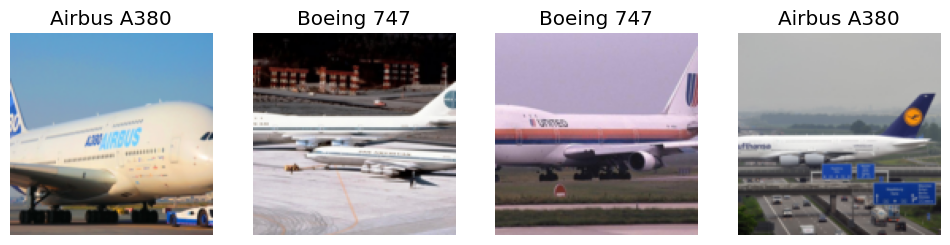

In [27]:
dls.valid.show_batch(max_n=4, nrows=1)

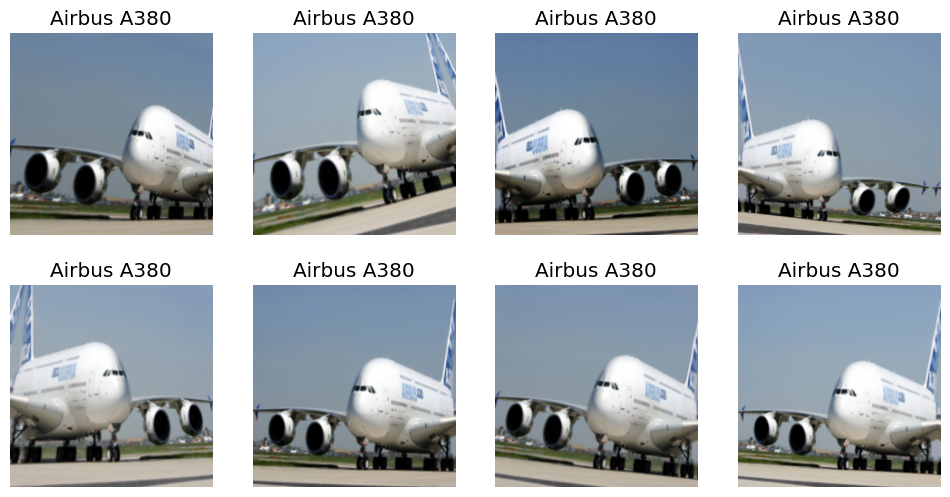

In [28]:
planes = planes.new(
    item_tfms=Resize(224, ResizeMethod.Squish),
    batch_tfms=aug_transforms())
dls = planes.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

In [29]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(15)

epoch,train_loss,valid_loss,error_rate,time
0,1.350352,1.010336,0.422222,00:13


epoch,train_loss,valid_loss,error_rate,time
0,0.839261,0.778195,0.355556,00:13
1,0.835376,0.656877,0.244444,00:13
2,0.790689,0.606594,0.222222,00:13
3,0.761096,0.654985,0.266667,00:14
4,0.705381,0.648844,0.244444,00:13
5,0.625210,0.585749,0.200000,00:13
6,0.592927,0.570173,0.177778,00:13
7,0.542124,0.544053,0.155556,00:13
8,0.491883,0.552713,0.133333,00:13
9,0.452793,0.543664,0.133333,00:13


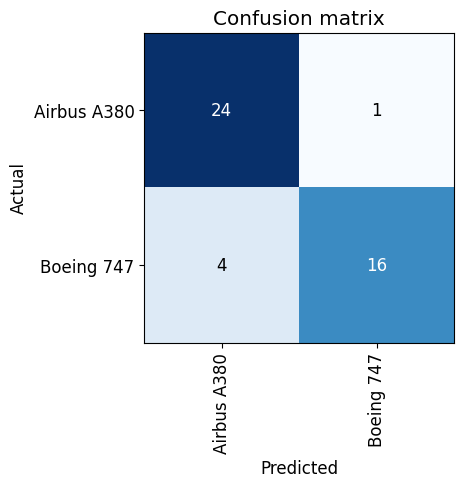

In [30]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

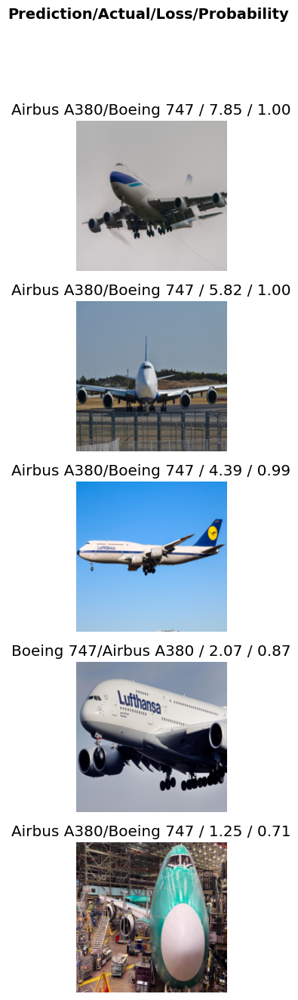

In [31]:
interp.plot_top_losses(5, nrows=5)

In [20]:
cleaner = ImageClassifierCleaner(learn, max_n=200)
cleaner

In [22]:
# print(f'Deleting {len(cleaner.delete())} images')
# for idx in cleaner.delete(): cleaner.fns[idx].unlink()
# for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

Deleting 1 images


In [32]:
learn.export()